
First, we begin by importing the necessary libraries and loading the dataset. In this case, we will load the images from the 'dataset2.zip' file and extract them to a separate folder called 'dataset2_images'

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import zipfile
import os
import random
import math

In [2]:
with zipfile.ZipFile('dataset2.zip', 'r') as zip_ref:
  zip_ref.extractall('dataset2_images')

dataset2_images = 'dataset2_images/'
print(os.listdir(dataset2_images))

['0011.jpg', '0003.jpg', '0009.jpg', '0002.jpg', '0001.jpg', '0008.jpg', '0010.jpg', '0020.jpg', '0007.jpg', '0030.jpg']


Let us first take a look at the images in the dataset before performing any transformations. A method called 'display_images' will be defined to get a visual representation of the images present in the dataset.

In [3]:
def display_images_grid(dataset, num_images=10, cols=10, show_axis=False):
    image_files = sorted(os.listdir(dataset))
    image_files = image_files[:num_images]  #num_image is no. of images in dataset with default value of 10

    rows = math.ceil(len(image_files) / cols) # calculates number of rows needed based on no. of cols passed in the param

    plt.figure(figsize=(20, rows * 2))

    for i, image_file in enumerate(image_files):
        img_path = os.path.join(dataset, image_file)
        img = cv.imread(img_path)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_rgb)
         # toggle axis
        if show_axis:
            plt.axis('on')
        else:
            plt.axis('off')

    plt.tight_layout()
    plt.show()



Apart from that, 'print_shape' was defined to get the shape of each photo in the dataset.

In [4]:
def print_shape(dataset, num_images=10):
    image_files = sorted(os.listdir(dataset))
    image_files = image_files[:num_images]

    for i, image_file in enumerate(image_files):
        img_path = os.path.join(dataset, image_file)
        img = cv.imread(img_path)

        if img is not None:
            print(f"{image_file} shape: {img.shape}") # prints img dimensions
        else:
            print(f"could not load {image_file}")

0001.jpg shape: (2648, 2045, 3)
0002.jpg shape: (1892, 1892, 3)
0003.jpg shape: (2317, 2317, 3)
0007.jpg shape: (3024, 4032, 3)
0008.jpg shape: (2679, 2679, 3)
0009.jpg shape: (2113, 2113, 3)
0010.jpg shape: (1414, 1414, 3)
0011.jpg shape: (4032, 3024, 3)
0020.jpg shape: (2559, 2559, 3)
0030.jpg shape: (4032, 3024, 3)


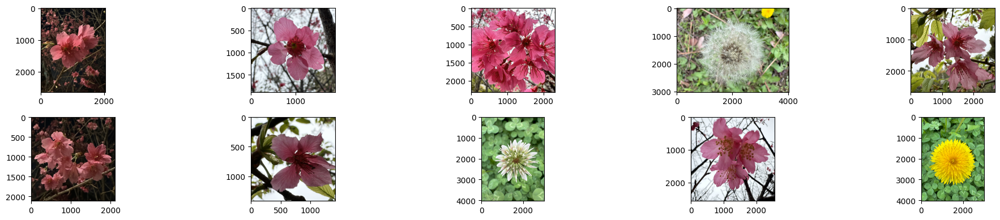

In [5]:
print_shape(dataset2_images, 10)
display_images_grid(dataset2_images, 10, 5, True)

# Data Formatting



This section involves formatting the images in the given dataset, where we reshape the images and save the transformed images to a separate directory.

**Reshape the images to (100,100,3) and saving it in separate directory**




In [6]:
reshaped_images = 'reshaped_images/'  # make a separate directory called reshaped_images
if not os.path.exists(reshaped_images):
    os.makedirs(reshaped_images)

In [7]:
for i, filename in enumerate(os.listdir(dataset2_images)):
        img_path = os.path.join(dataset2_images, filename)
        img = cv.imread(img_path)

        img_resized = cv.resize(img, (100, 100))  # reshape the images to (100, 100, 3)
        resized_img_path = os.path.join(reshaped_images, filename)
        cv.imwrite(resized_img_path, img_resized)

0001.jpg shape: (100, 100, 3)
0002.jpg shape: (100, 100, 3)
0003.jpg shape: (100, 100, 3)
0007.jpg shape: (100, 100, 3)
0008.jpg shape: (100, 100, 3)
0009.jpg shape: (100, 100, 3)
0010.jpg shape: (100, 100, 3)
0011.jpg shape: (100, 100, 3)
0020.jpg shape: (100, 100, 3)
0030.jpg shape: (100, 100, 3)


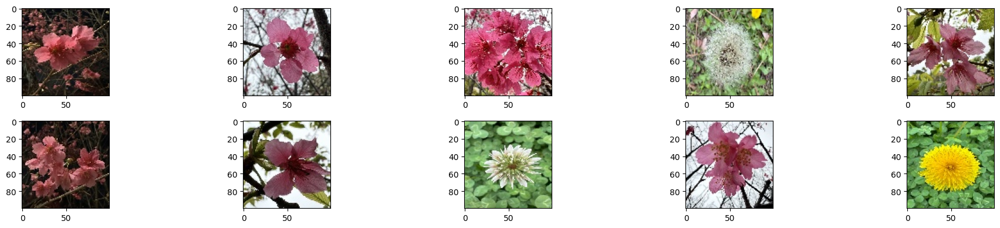

In [8]:
print_shape(reshaped_images, 10)
display_images_grid(reshaped_images, 10, 5, True)

As seen above, all the images have the shape (100, 100, 3) after reshaping.

# Data Augmentation

In this section, we will explore and define various data augmentation techniques by creating methods that can effectively manipulate images.

**Randomly put a black patch over a portion of the image**

In [9]:
def add_black_patch(image, patch_size=(50, 50)):
    height, width, _ = image.shape

    top = np.random.randint(0, height - patch_size[0])
    left = np.random.randint(0, width - patch_size[1])

    image[top:top + patch_size[0], left:left + patch_size[1]] = [0, 0, 0] # black rectangle patch is created
    return image


**Shift an image sideward or upwards**

In [10]:
def shift_image(image, x_shift=0, y_shift=0):
    height, width, _ = image.shape  # get img dimensions
    translation_matrix = np.float32([[1, 0, x_shift], [0, 1, y_shift]]) # create a translation matrix with the provided params (horizontal and vertical shift)
    shifted_image = cv.warpAffine(image, translation_matrix, (width, height)) # shift the image according to the translation matrix
    return shifted_image

**Rotate an image**

In [11]:
def rotate_image(image, angle):
    height, width, _ = image.shape
    center = (width // 2, height // 2)
    rotation_matrix = cv.getRotationMatrix2D(center, angle, 1.0) # create a rotation matrix with the provided param (angle)
    rotated_image = cv.warpAffine(image, rotation_matrix, (width, height)) # rotate image according to rotation matrix
    return rotated_image

**Flip an image either vertically or horizontally**

In [12]:
def flip_image(image, direction='horizontal'):
    if direction == 'horizontal':
        return cv.flip(image, 1)
    elif direction == 'vertical':
        return cv.flip(image, 0)
    else:
        raise ValueError("direction must be 'horizontal' or 'vertical'.")

To test the defined functions, we will load a single image and apply the transformations

(-0.5, 593.5, 757.5, -0.5)

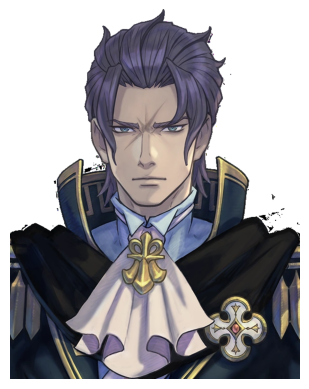

In [13]:
sample_img = cv.imread('vanzieks.png')
sample_img = cv.cvtColor(sample_img, cv.COLOR_BGR2RGB)
plt.imshow(sample_img)
plt.axis('off')

We make a copy of the original image then apply the following transformations:


*   add a black patch of 100 x 100 pixels to a random location on the image
*   shift the image 50 pixels to the left and 60 pixels upwards
*   flip the image vertically
*   rotate the image slightly by 5 degrees to the right (clockwise)



(-0.5, 593.5, 757.5, -0.5)

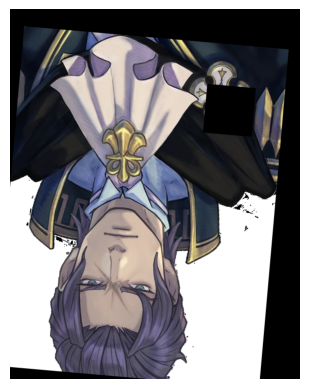

In [14]:
edited_img = sample_img.copy()
edited_img = add_black_patch(edited_img, (100, 100))
edited_img = shift_image(edited_img, -50, -60)
edited_img = flip_image(edited_img, 'vertical')
edited_img = rotate_image(edited_img, -5)

plt.imshow(edited_img)
plt.axis('off')

**Produce a new augmented dataset with at least 100 images (original images included) using the functions made in the previous action item.**

To efficiently produce an augmented 100-image dataset with the previously defined functions, we will create a new method called 'apply_random_transformations'. This processes a dataset of images in batches, where 'batch_size' is the number of data samples that are processed together in a single iteration of the processing loop. It then applies one random transformation to each image and then saves the results in a specified output directory.

We can specify the black patch size, horizontal or vertical shift as well as the angle of rotation for the images.

In [15]:
def apply_random_transformations(dataset_path, output_path, batch_size=10, patch_size=(50, 50), x_shift=30, y_shift=20, angle=45):
    os.makedirs(output_path, exist_ok=True)
    dataset = [os.path.join(dataset_path, img) for img in sorted(os.listdir(dataset_path))]

    total_images = len(dataset)

    for i in range(0, total_images, batch_size):
        batch = dataset[i:i + batch_size]
        transformation_type = random.choice([0, 1, 2, 3]) # randomly applies a single transformation on an image

        for image_path in batch:
            img = cv.imread(image_path)
            if img is None:
                print(f"Error loading image: {image_path}")
                continue  # skip to next img if current cant be loaded

            # applies the transformations accordingly
            if transformation_type == 0:
                transformed_img = add_black_patch(img, patch_size)
            elif transformation_type == 1:
                transformed_img = shift_image(img, x_shift, y_shift)
            elif transformation_type == 2:
                transformed_img = rotate_image(img, angle)
            elif transformation_type == 3:
                transformed_img = flip_image(img, direction=random.choice(['horizontal', 'vertical']))


            image_name = os.path.basename(image_path)
            output_image_path = os.path.join(output_path, f"transformed_{image_name}")

            # save the transformed img to a separate directory
            cv.imwrite(output_image_path, transformed_img)

To apply this method, we will load a dataset containing 138 images, including the original images from 'dataset2', and display them to get a view of how they look like before transformation

In [16]:
with zipfile.ZipFile('100imgdataset.zip', 'r') as zip_ref:
  zip_ref.extractall('100_img_dataset/')

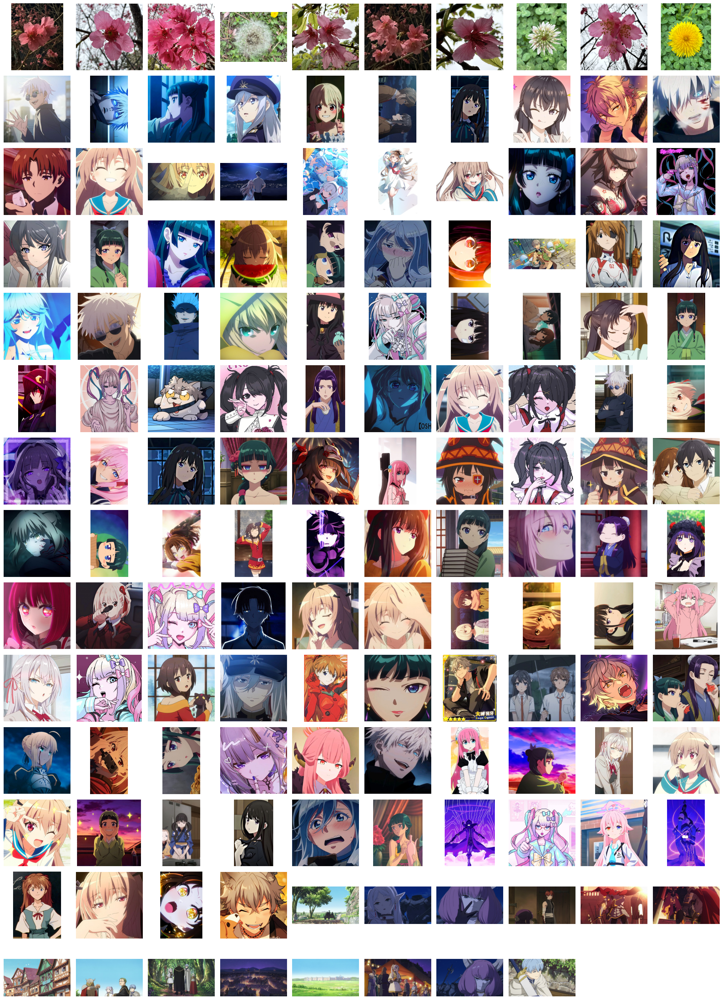

In [17]:
display_images_grid('100_img_dataset/', 138, 10, False)

Apply random transformations on the dataset and save the output to a new directory called 'edited100_img'. A batch size of 1 will be defined.

*   Black patch size is specified with a height of 100px and a width of 100px
*   Translations will have a horizontal shift of 100px and vertical shift of 50px
*   Rotations will be 45 degrees to the left (counter-clockwise)



In [18]:
apply_random_transformations('100_img_dataset/', 'edited100_img/', batch_size=1, patch_size=(100, 100), x_shift=100, y_shift=50, angle=45)

The results of transformation can be seen by displaying the images in the augmented dataset.

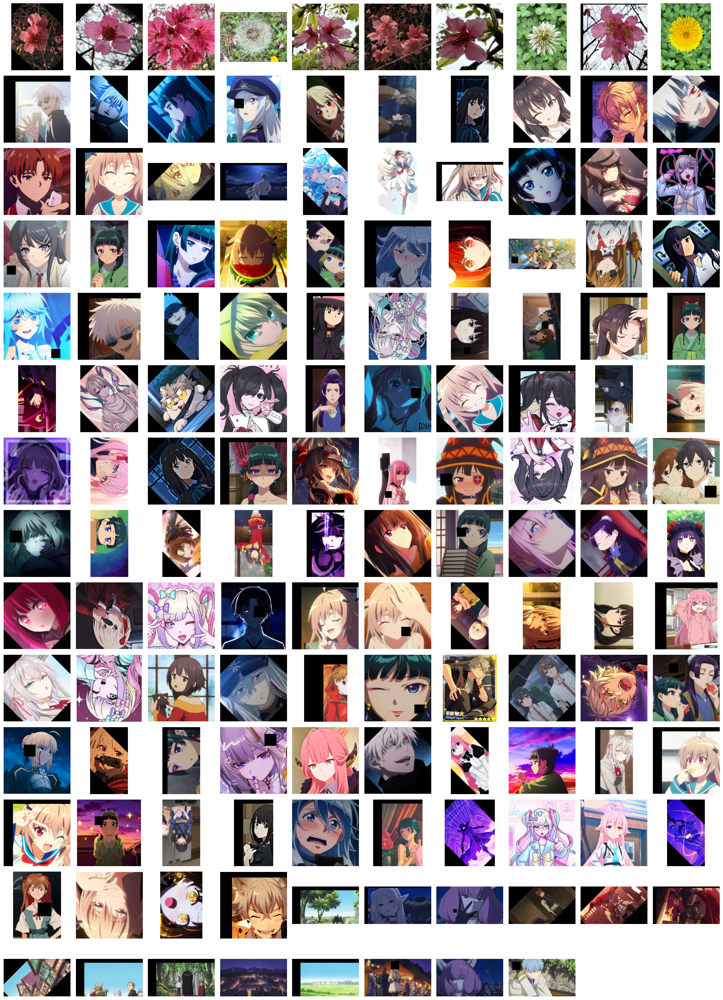

In [19]:
display_images_grid('edited100_img/', 138, 10, False)

# Guide Questions


**Define Data Augmentation and discuss its importance and the importance of understanding digital image processing for such an activity.**

Data augmentation is a method used a lot in machine learning, particularly within the realm of computer vision, to enhance the variety of data available without the gathering additional data. Data augmentation plays an importance in the field as the goal of the augmentation is to generate new, slightly modified versions of the original images to help improve the generalization capability of models, especially neural networks, by exposing them to a wider range of scenarios during training. This can be done by applying various transformations such as rotating, flipping, scaling, shifting, and more to the existing dataset which we did in this activity. It is important to understand and know the basics of these transformations or processes because poorly executed reshaping, shifting or flipping can introduce unwanted artifacts and results which can harm the model's learning.

**What other data augmentation techniques are applicable and not applicable to the dataset you have produced? Why?**

Other applicable techniques to the data set are color jittering, zoom in/out, channel shuffling and more as these techniques overall enhance the model generalization. Color jittering alters the brightness, contrast, saturation, or hue of an image and this can train the model to handle low-light or poor-quality images.  Zoom can help the model to recognize objects regardless of their size or proximity in the image. Lastly, channel shuffling involves randomly changing the order of RGB channels and this helps prevent the model from relying on specific color channels for decision-making. Techniques that are not applicable are inverting colors and pixel shuffling. During the model's training, using the inverted version of an image does not make sense  as this trains the model on images with irrelevant features. Shuffling individual pixels randomly across the image destroys the overall structure of the image, making it almost impossible for the model to recognize meaningful features.